 ## Importing Libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.gridspec as gridspec
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, \
classification_report, confusion_matrix, precision_recall_curve, \
average_precision_score, roc_curve, auc
from sklearn.model_selection import KFold, StratifiedKFold


 ## Importing dataset

In [2]:
dataset = pd.read_csv('creditcard.csv')


 ## View information about the dataset.

In [3]:
dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
Time      284807 non-null float64
V1        284807 non-null float64
V2        284807 non-null float64
V3        284807 non-null float64
V4        284807 non-null float64
V5        284807 non-null float64
V6        284807 non-null float64
V7        284807 non-null float64
V8        284807 non-null float64
V9        284807 non-null float64
V10       284807 non-null float64
V11       284807 non-null float64
V12       284807 non-null float64
V13       284807 non-null float64
V14       284807 non-null float64
V15       284807 non-null float64
V16       284807 non-null float64
V17       284807 non-null float64
V18       284807 non-null float64
V19       284807 non-null float64
V20       284807 non-null float64
V21       284807 non-null float64
V22       284807 non-null float64
V23       284807 non-null float64
V24       284807 non-null float64
V25       284807 non-null float64
V26  

In [4]:
dataset.describe()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [5]:
dataset.isnull().sum()


Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [6]:
dataset.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


 ## Data Visualization

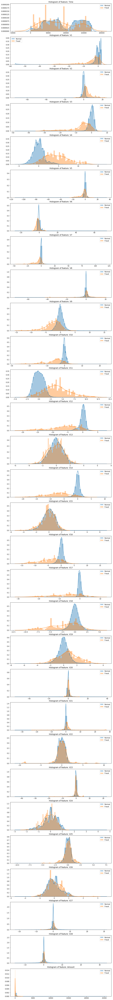

In [7]:
# Select the features
v_features = dataset.iloc[:, 0:30].columns

plt.figure(figsize = (12, 120))
gs = gridspec.GridSpec(30, 1)
for i, cn in enumerate(dataset[v_features]):
    ax = plt.subplot(gs[i])    
    sns.distplot(dataset[cn][dataset.Class == 0], bins = 50, label = 'Normal')
    sns.distplot(dataset[cn][dataset.Class == 1], bins = 50, label = 'Fraud')
    ax.set_xlabel('')
    ax.set_title('Histogram of feature: ' + str(cn))
    plt.legend()
plt.show()


 ## Collect columns we need

In [8]:
dataset_X = dataset.drop(['Class'], axis = 1)
dataset_y = dataset['Class']
y = dataset_y.values

In [9]:
# Drop 'Time', 'Amount'
drop_list = ['Time', 'Amount']
X = dataset_X.drop(drop_list, axis = 1)
X = X.values


 ## Splitting the dataset into the Training set and Test set

In [10]:
def split_data(X, y):
    from sklearn.model_selection import train_test_split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify = y, random_state = 0)
    print('train-set size: ', len(y_train), 
          '\ntest-set size: ', len(y_test))    
    print('fraud cases in train-set', sum(y_train),
          '\nfraud cases in test-set: ', sum(y_test))
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = split_data(X, y)


train-set size:  199364 
test-set size:  85443
fraud cases in train-set 344 
fraud cases in test-set:  148


 ## Define function to get predictions

In [11]:
def get_predictions(y_true, y_pred): 
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, cmap = "coolwarm", annot = True, linewidths = 0.5)
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted class")
    plt.ylabel("Real class")
    plt.show()
    print('==============================')
    print(cm)
    print('==============================')
    print('accuracy = {}'.format(accuracy_score(y_true, y_pred)))
    print('precision = {}'.format(precision_score(y_true, y_pred)))
    print('recall = {}'.format(recall_score(y_true, y_pred)))
    print('f1 score = {}'.format(f1_score(y_true, y_pred)))
    print('==============================')
    print(classification_report(y_true, y_pred))


In [12]:
# ## Fitting the classifier to the Training set: Logistic Regression

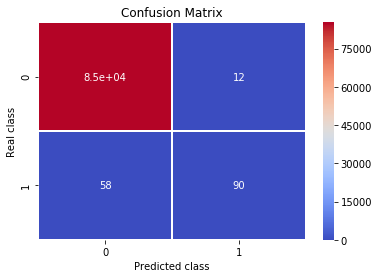

[[85283    12]
 [   58    90]]
accuracy = 0.9991807403766253
precision = 0.8823529411764706
recall = 0.6081081081081081
f1 score = 0.72
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.88      0.61      0.72       148

   micro avg       1.00      1.00      1.00     85443
   macro avg       0.94      0.80      0.86     85443
weighted avg       1.00      1.00      1.00     85443



In [13]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(solver = 'liblinear', random_state = 0)
classifier.fit(X_train, y_train)

# Predict Test set
y_pred = classifier.predict(X_test)
y_score = classifier.predict_proba(X_test)[:, 1]
get_predictions(y_true = y_test, y_pred = y_pred)

 ## Plot scores, ROC, PRF, PR curves

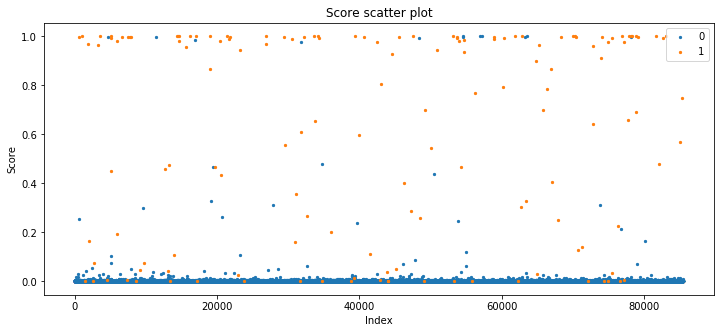

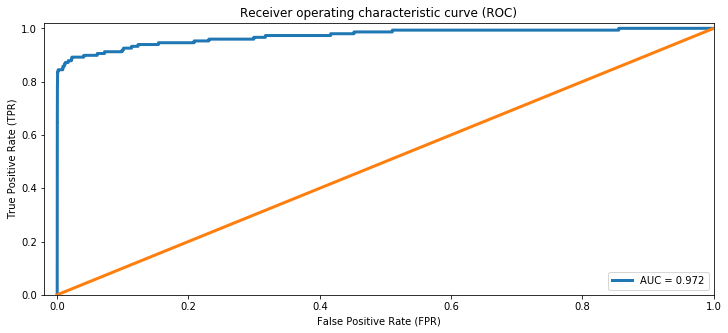

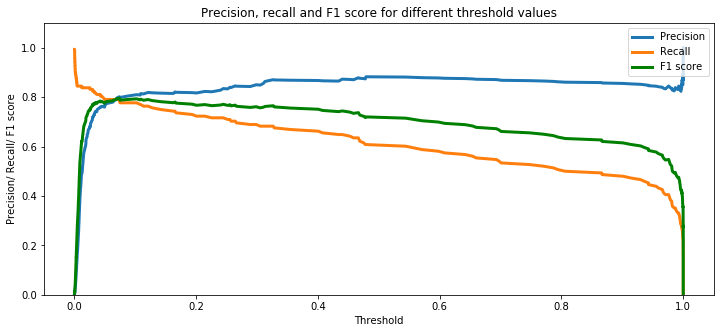

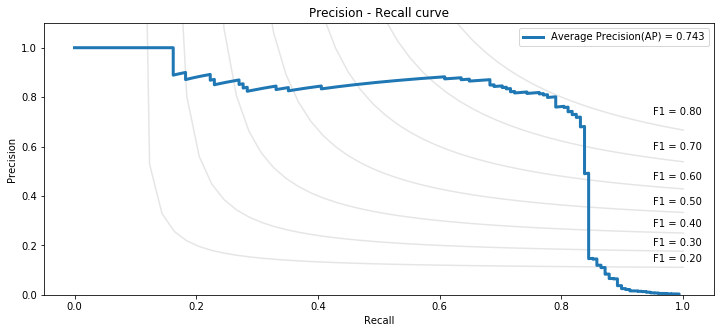

In [14]:
import curves as C
C.plot_scores(y_true = y_test, y_score = y_score)
fpr, tpr = C.plot_ROC(y_true = y_test, y_score = y_score)
precision, recall, threshold, f1_scores = C.plot_precision_recall_vs_threshold(y_true = y_test, y_score = y_score)
C.plot_precision_recall(y_true = y_test, y_score = y_score)



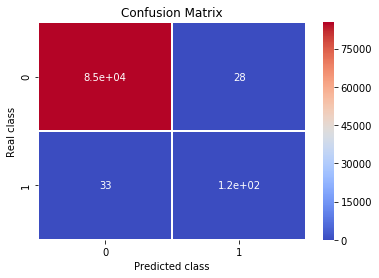

[[85267    28]
 [   33   115]]
accuracy = 0.9992860737567735
precision = 0.8041958041958042
recall = 0.777027027027027
f1 score = 0.7903780068728522
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.80      0.78      0.79       148

   micro avg       1.00      1.00      1.00     85443
   macro avg       0.90      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [15]:
# Predicting the Test set
threshold = 0.1
y_score = classifier.predict_proba(X_test)[:, 1]
y_pred = (y_score > threshold)
get_predictions(y_true = y_test, y_pred = y_pred)


 ## Select threshold by stratifiefKfold cross-validation

In [16]:
from selectThreshold import selectThresholdByCV
skf = StratifiedKFold(n_splits = 10)
thresholds = np.array([0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])
classifier = LogisticRegression(solver = 'liblinear', random_state = 0)

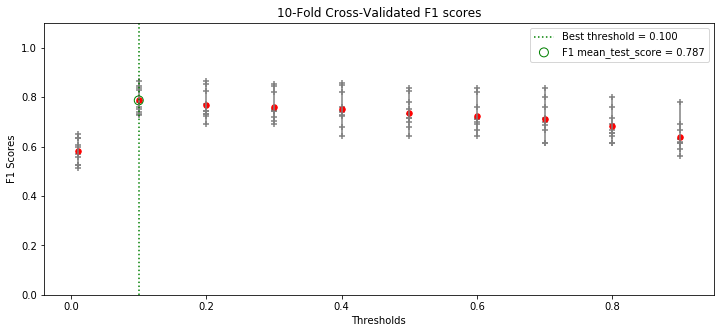

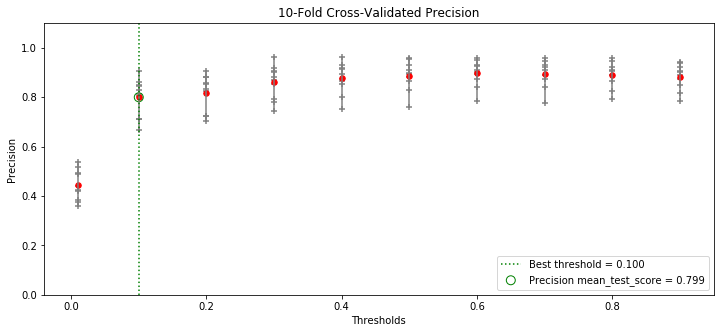

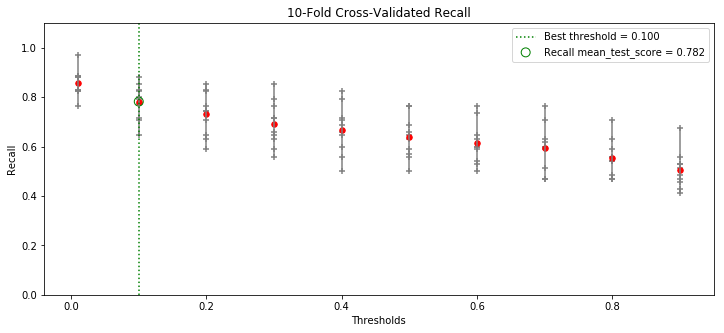

{'F1': array([0.78686212]),
 'Precision': array([0.79946295]),
 'Recall': array([0.78201681]),
 'Threshold': array([0.1])}

In [17]:
best_threshold, results = selectThresholdByCV(clf = classifier, X = X_train, y = y_train, 
                                              thresholds = thresholds, cv = skf, 
                                              plot_result = True)
best_threshold


 Predicting the Test set using best_threshold

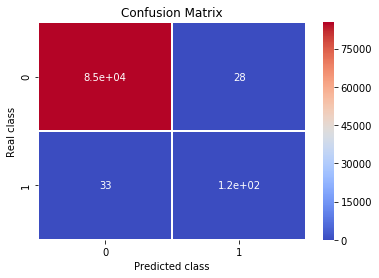

[[85267    28]
 [   33   115]]
accuracy = 0.9992860737567735
precision = 0.8041958041958042
recall = 0.777027027027027
f1 score = 0.7903780068728522
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85295
           1       0.80      0.78      0.79       148

   micro avg       1.00      1.00      1.00     85443
   macro avg       0.90      0.89      0.90     85443
weighted avg       1.00      1.00      1.00     85443



In [18]:
classifier = LogisticRegression(solver = 'liblinear', random_state = 0)
classifier.fit(X_train, y_train)
threshold = best_threshold['Threshold']
y_score = classifier.predict_proba(X_test)[:, 1]
y_pred = (y_score > threshold)
get_predictions(y_true = y_test, y_pred = y_pred)
